In [1]:
import cv2
import numpy as np
import pytesseract

def identificar_angulo(imagen):
    imagen_gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
    bordes = cv2.Canny(imagen_gris, 50, 150, apertureSize=3)
    
    # Utilizar la transformada de Hough probabilística
    lineas = cv2.HoughLinesP(bordes, 1, np.pi / 180, threshold=100, minLineLength=100, maxLineGap=10)
    
    if lineas is None:
        return 0.0  # Si no se detectan líneas, se asume que la imagen está orientada correctamente

    # Filtrar las líneas por longitud y orientación
    angulos = []
    for linea in lineas:
        x1, y1, x2, y2 = linea[0]
        longitud = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
        angulo = np.arctan2(y2 - y1, x2 - x1)
        angulos.append(angulo)

    # Calcular el ángulo promedio
    angulo_promedio = np.degrees(np.median(angulos))
    
    # Verificar si el ángulo está dentro del rango de -100 a -80 grados
    if -100 <= angulo_promedio <= -80:
        angulo_promedio = 180 + angulo_promedio
        print("La imagen está rotada aproximadamente a -90 grados.")
    
    return angulo_promedio


def ajustar_imagen(imagen, angulo):
    altura, ancho = imagen.shape[:2]
    centro = (ancho // 2, altura // 2)
    matriz_rotacion = cv2.getRotationMatrix2D(centro, -angulo, 1.0)
    imagen_rotada = cv2.warpAffine(imagen, matriz_rotacion, (ancho, altura), flags=cv2.INTER_LINEAR)

    return imagen_rotada

def realizar_ocr(imagen):
    texto = pytesseract.image_to_string(imagen)
    return texto
ruta_imagen = 'rotadas/10132602005.pdf_page_9.png'

# Cargar la imagen
imagen = cv2.imread(ruta_imagen)

# Identificar el ángulo de la imagen
angulo = identificar_angulo(imagen)
print(angulo)
# Ajustar la imagen para que tenga 0 grados
imagen_ajustada = ajustar_imagen(imagen, angulo)
plt.imshow(imagen_ajustada)
plt.show()
# Realizar OCR en la imagen ajustada
texto = realizar_ocr(imagen_ajustada)
texto

In [35]:
from imutils.perspective import four_point_transform
import cv2
import numpy

# Load image, grayscale, Gaussian blur, Otsu's threshold
image = cv2.imread("output/10132602005.pdf/10132602005.pdf_page_10.png")
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (7,7), 0)
thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

# Find contours and sort for largest contour
cnts = cv2.findContours(thresh, cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
cnts = sorted(cnts, key=cv2.contourArea, reverse=True)
displayCnt = None

for c in cnts:
    # Perform contour approximation
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)
    if len(approx) == 4:
        displayCnt = approx
        break

# Obtain birds' eye view of image
warped = four_point_transform(image, displayCnt.reshape(4, 2))

cv2.imshow("thresh", thresh)
cv2.imshow("warped", warped)
cv2.waitKey(0)

In [ ]:
import cv2
import numpy as np
import os
def run_vision(tiff_path, pdf_folder, images):        

    for i in range(1, 14):
        tiff_filename = f"pagina{i}.tiff"
        tiff_path = os.path.join(pdf_folder, tiff_filename)

        image = images[i - 1]
        image.save(tiff_path, "TIFF")                
            
        img = cv2.imread(tiff_path)
        height, width = img.shape[:2]  # Obtém as dimensões da imagem carregada
        
        # Se a imagem estiver na orientação horizontal, gire-a
        if width > height:  # Verifica se a largura é maior que a altura
            # Gire a imagem em 90 graus no sentido horário
            img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
            cv2.imwrite(tiff_path, img)  

        img = cv2.imread(tiff_path, cv2.IMREAD_GRAYSCALE)

        if img.shape[1] > img.shape[0]:
            img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)

        # Aplicar limiarização para binarizar a imagem
        _, binary_img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

        # Remover ruído usando abertura morfológica
        kernel = np.ones((3, 3), np.uint8)
        opening = cv2.morphologyEx(binary_img, cv2.MORPH_OPEN, kernel, iterations=2)

        # Encontrar os contornos na imagem binarizada
        contours, _ = cv2.findContours(opening, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Inicializar variáveis para armazenar a região da logomarca 
        itau_region = None
        largest_area = 0

        # Iterar sobre os contornos encontrados
        for contour in contours:
            # Calcular a área do contorno
            area = cv2.contourArea(contour)

            # Eliminar contornos muito pequenos que podem ser riscos de escrita
            if area < 1020:
                continue

            # Verificar se o contorno está na parte superior ou no rodapé do documento
            x, y, w, h = cv2.boundingRect(contour)
            if y < img.shape[0] * 0.1 or y + h > img.shape[0] * 0.9:
                # Atualizar a maior área e a região da logomarca 
                if area > largest_area:
                    largest_area = area
                    itau_region = contour

        # Se encontrarmos a logomarca 
        if itau_region is not None:
            # Obter as coordenadas do bounding box da região (logomarca)
            x, y, w, h = cv2.boundingRect(itau_region)

            # Exibir as coordenadas do bounding box
            print(f"Página {i}: Coordenadas do bounding: (x={x}, y={y}, w={w}, h={h})")

            # Desenhar o bounding box na imagem original
            img_with_bbox = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
            cv2.rectangle(img_with_bbox, (x, y), (x + w, y + h), (255, 0, 0), 2)

            # Verificar se a região da logomarca está no rodapé da imagem
            altura_imagem = img.shape[0]
            limiar_rodape = altura_imagem * 0.9
            
            if y + h > limiar_rodape:
                # Se a logomarca estiver no rodapé, realizar a rotação da imagem em 180 graus
                img_with_bbox = cv2.rotate(img_with_bbox, cv2.ROTATE_180)

            # Salvar a imagem com o bounding box no diretório do PDF
            img_path_with_bbox = os.path.join(pdf_folder, f"pagina{i}.tiff")
            cv2.imwrite(img_path_with_bbox, img_with_bbox)

In [1]:
img = cv2.imread("output/10132602005.pdf/10132602005.pdf_page_9.png")
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray_img = cv2.bitwise_not(gray_img)
coordinates = np.column_stack(np.where(gray_img > 0))
ang = cv2.minAreaRect(coordinates)[-1]
if ang < -45:
    ang = -(90 + ang)
else:
    ang = -ang
print(ang)
high, width = img.shape[:2]
center = (width // 2, high // 2)
rotation_matrix = cv2.getRotationMatrix2D(center, ang, 1.0)
rotated_img = cv2.warpAffine(img, rotation_matrix, (width, high), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

NameError: name 'cv2' is not defined

In [ ]:
gray_img = cv2.bitwise_not(gray_img)
coordinates = np.column_stack(np.where(gray_img > 0))
ang = cv2.minAreaRect(coordinates)[-1]
if ang < -45:
    ang = -(90 + ang)
else:
    ang = -ang
print(ang)
high, width = img.shape[:2]
center = (width // 2, high // 2)
rotation_matrix = cv2.getRotationMatrix2D(center, ang, 1.0)
rotated_img = cv2.warpAffine(img, rotation_matrix, (width, high), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

-90.0


In [ ]:
ang = cv2.minAreaRect(coordinates)[-1]

In [ ]:
if ang < -45:
    ang = -(90 + ang)
else:
    ang = -ang
print(ang)
high, width = img.shape[:2]
center = (width // 2, high // 2)
rotation_matrix = cv2.getRotationMatrix2D(center, ang, 1.0)
rotated_img = cv2.warpAffine(img, rotation_matrix, (width, high), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

-90.0


In [ ]:
high, width = img.shape[:2]
center = (width // 2, high // 2)
rotation_matrix = cv2.getRotationMatrix2D(center, ang, 1.0)
rotated_img = cv2.warpAffine(img, rotation_matrix, (width, high), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

In [ ]:
Image.fromarray(rotated_img).show()

NameError: name 'Image' is not defined

: 

In [25]:
import cv2 
import pytesseract

def float_convertor(x):
    if x.isdigit():
        out= float(x)
    else:
        out= x
    return out 

def tesseract_find_rotatation(img: str):
    img = cv2.imread(img) if isinstance(img, str) else img
    k = pytesseract.image_to_osd(img)
    high, width = img.shape[:2]

    center = (width // 2, high // 2)

    ang = float_convertor(k.split("\n")[2].split(":")[-1].strip())
    rotation_matrix = cv2.getRotationMatrix2D(center, 360-ang, 1.0)
    rotated_img = cv2.warpAffine(img, rotation_matrix, (width, high), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    return rotated_img, ang

In [26]:
im, out = tesseract_find_rotatation("output/10132602005.pdf/10132602005.pdf_page_9.png")

In [27]:
import PIL
from PIL import Image

texto = pytesseract.image_to_string(Image.open("output/10132602005.pdf/10132602005.pdf_page_9.png"))
texto

'itau Unibanco S.A. CONTRATO N° 10132602005\n\nINSTRUMENTO PARTICULAR DE VENDA E COMPRA DE BEM IMOVEL, FINANCIAMENTO COM\nGARANTIA DE ALIENAGAO FIDUCIARIA DE IMOVEL E OUTRAS AVENCAS\n\n \n\npara o Itau, o Comprador devera desocupa-lo, sob pena de pagamento ao Itau, ou aquele que o\ntiver adquirido em leilao, a titulo de taxa de ocupagcao, por més ou fracgao, o equivalente a 1% do\nvalor de avaliagao do Imovel previsto no item 13, exigivel desde a data da alienacgao do imovel\nem leilao até a data em que o fiduciario, ou seus sucessores, vier a ser emitido na posse do\nimovel, acrescido da variagdo do IGP-M, bem como o valor equivalente as despesas: a) do foro\ne das despesas de agua, luz e gas referentes ao Imovel; b) de todas as despesas e\ncontribuigoes devidas ao condominio de utilizagao ou a associagao que congregue os\nmoradores do conjunto imobiliario integrado pelo Imovel; c) de todas as despesas necessarias\na reposicgao do Imovel ao estado em que o recebeu.\n\nimportante: caso

In [28]:
import numpy as np

def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    else:
        angle = -angle
    
    # If width is greater than height, swap angle
    if minAreaRect[1][0] > minAreaRect[1][1]:
        angle = 90 + angle    
    
    return angle
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    # if w < h:
    #     newImage = np.rot90(newImage)
    
    
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage

In [29]:
# Deskew image
import cv2
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

new = cv2.imread("rotadas/10132602005.pdf_page_9.png")

fixed = deskew(new)
cv2.imwrite("rotated_fixed.jpg", fixed)



619


True

In [30]:
#https://stackoverflow.com/questions/28816046/
#displaying-different-images-with-actual-size-in-matplotlib-subplot
from matplotlib import pyplot as plt
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

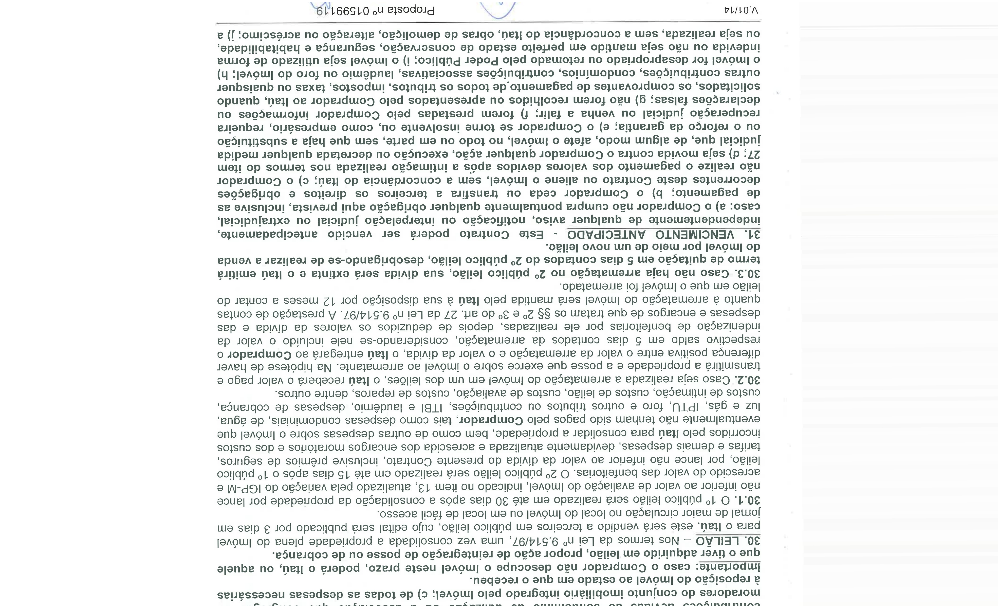

In [31]:
display("rotated_fixed.jpg")

In [32]:
import pytesseract
text = pytesseract.image_to_string("rotated_fixed.jpg")

In [33]:
from pprint import pprint
pprint(text)

("‘61166510 ot! esodolg Rt PLILO'A\n"
 '\n'
 ' \n'
 '\n'
 'e (f ‘oumosasoe no oedesaze ‘oedSjowap ap seigo ‘ne Op elsuUePJODUOD eB Was '
 '‘epezijeas efas no\n'
 '‘gpepiiqeyiqey a eSueinbas ‘oedseAsaSUuOd ap Ope}sa o}ldjiod We Opjuew efas '
 'oeUu NO eplAapul\n'
 'BuO] ap Opezyyn elas jaAou] oO (i fool[qnd Japod Ojad Opewojes no '
 'opeludoidesap 10} JaAQU] O\n'
 '(y {jJ@AQW] Op O10} No OlwWEpNne] ‘seAHeI2osse SeQdinqi4jUOD ‘SOIUIWOPUOD '
 '‘saQdinql4jUOD Se41}NO\n'
 'sanbsienb no sexe} ‘so}sodul ‘sojnqi4} SO SOpo} ep o}Uswebed op sajueAOJdWOD '
 'SO ‘sope}IoI[os\n'
 'opuenb ‘neq oe Jopeidwiog ojead sopeyuasaide no sopiyjooes wias0j oeu (6 '
 '‘sesje} saqdseiej9ap\n'
 'no seodseuuojul Jopesdwioy ojod sepeysoid weasoy (J Sayjejy e BYUSA no '
 'jeloipnf oedSesadnsoai\n'
 'eilanbas ‘ollesaiduia OWOD ‘NO aJUdAJOSUI GUO} aS JOpeidWOD o (a ‘eHUeIeH ep '
 'Od10Ja1 O no\n'
 'oedsinyysqns e efey aonb was ‘ajied Wa no Opo} ou ‘JaAow] O aJaye ‘Opow '
 'winbye ap ‘enb jelsipni\n'
 'epipoew sanbjen

In [37]:
import cv2
import pytesseract

def detectar_pagina_volteada(ruta_imagen):
    # Leer la imagen
    imagen = cv2.imread(ruta_imagen)

    # Convertir la imagen a escala de grises
    gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)

    # Realizar OCR para extraer texto
    texto = pytesseract.image_to_string(gris)

    # Analizar la orientación del texto (puedes necesitar una lógica más sofisticada aquí)
    esta_volteada = es_texto_vertical(texto)

    return esta_volteada

def es_texto_vertical(texto):
    # Lógica simple para determinar si el texto es vertical u horizontal
    # Puedes mejorar esto según tu caso específico
    # Por ejemplo, podrías verificar la distribución de los ángulos de texto
    # o usar un modelo de aprendizaje automático para una mayor precisión.
    # Esto es solo un ejemplo básico.
    if len(texto.split('\n')) > 1:
        return True
    else:
        return False

# Ejemplo de uso
ruta_imagen = 'output/10130590301.pdf/10130590301.pdf_page_2.png'
volteada = detectar_pagina_volteada(ruta_imagen)
if volteada:
    print("La página está volteada.")
else:
    print("La página no está volteada.")

La página está volteada.


In [63]:
import math

def detectar_y_corregir_volteo(imagen):
    # Convertir la imagen a escala de grises
    gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
    
    # Detectar bordes en la imagen
    bordes = cv2.Canny(gris, 50, 150)
    

   # Encontrar líneas en la imagen
    lineas = cv2.HoughLinesP(bordes, 1, math.pi / 180, 100, minLineLength=100, maxLineGap=10)
       # Calcular la inclinación promedio de las líneas detectadas
    inclinacion_promedio = 0
    if lineas is not None:
        for linea in lineas:
            x1, y1, x2, y2 = linea[0]
            inclinacion_promedio += (y2 - y1) / (x2 - x1)
        inclinacion_promedio /= len(lineas)
    
    # Si la inclinación promedio es negativa, girar la imagen 180 grados
    if inclinacion_promedio < 0:
        imagen_girada = cv2.rotate(imagen, cv2.ROTATE_180)
    else:
        imagen_girada = imagen
    
    return imagen_girada

# Cargar la imagen
ruta_imagen = 'rotated_fixed3.jpg'
imagen = cv2.imread(ruta_imagen)

# Detectar y corregir el volteo
imagen_corregida = detectar_y_corregir_volteo(imagen)




In [64]:
cv2.imwrite("rotated_fixed4.jpg", imagen_corregida)

True

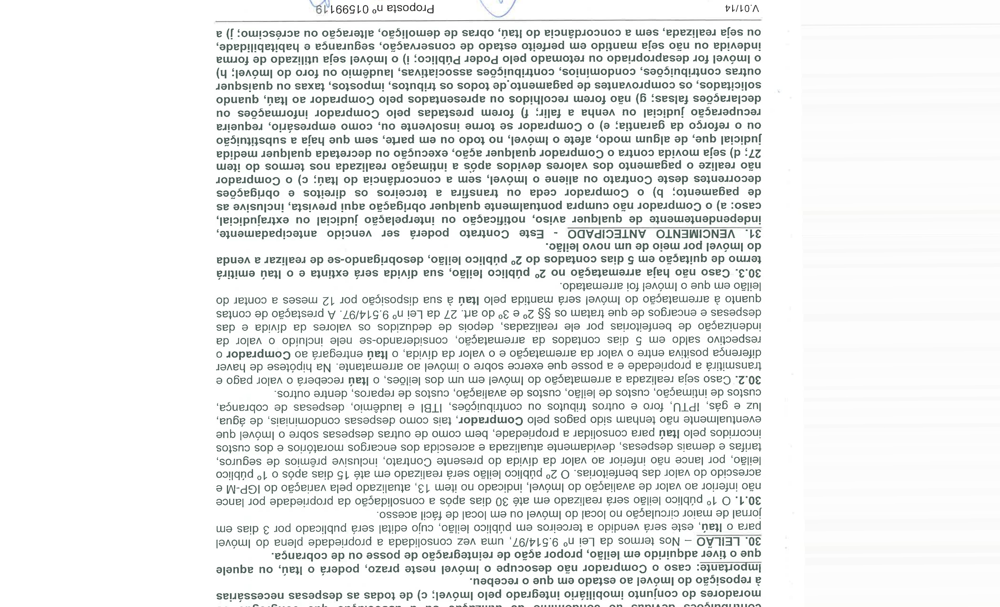

In [65]:
import PIL
from PIL import Image
Image.open("rotated_fixed4.jpg")

In [8]:
import numpy as np
import cv2
import pytesseract
import PIL


import numpy as np

def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    else:
        angle = -angle
    
    # If width is greater than height, swap angle
    if minAreaRect[1][0] > minAreaRect[1][1]:
        angle = 90 + angle    
    
    return angle
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    # if w < h:
    #     newImage = np.rot90(newImage)
    
    
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage




def rotate(image, angle):
    # Obtain the dimensions of the image
    (height, width) = image.shape[:2]
    (cX, cY) = (width / 2, height / 2)

    # Grab the rotation components of the matrix
    matrix = cv2.getRotationMatrix2D((cX, cY), -angle, 1.0)
    cos = np.abs(matrix[0, 0])
    sin = np.abs(matrix[0, 1])

    # Find the new bounding dimensions of the image
    new_width = int((height * sin) + (width * cos))
    new_height = int((height * cos) + (width * sin))

    # Adjust the rotation matrix to take into account translation
    matrix[0, 2] += (new_width / 2) - cX
    matrix[1, 2] += (new_height / 2) - cY

    # Perform the actual rotation and return the image
    return cv2.warpAffine(image, matrix, (new_width, new_height))

image = cv2.imread("rotadas/10132602005.pdf_page_9.png")
original_image = image.copy()





gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (3,3), 0)
thresh = cv2.threshold(blurred, 110, 255, cv2.THRESH_BINARY_INV)[1]

x, y, w, h = 0, 0, image.shape[1], image.shape[0]

top_half = ((x,y), (x+w, y+h/2))
bottom_half = ((x,y+h/2), (x+w, y+h))

top_x1,top_y1 = top_half[0]
top_x2,top_y2 = top_half[1]
bottom_x1,bottom_y1 = bottom_half[0]
bottom_x2,bottom_y2 = bottom_half[1]

# to integer
top_x1 = int(top_x1)
top_y1 = int(top_y1)
top_x2 = int(top_x2)
top_y2 = int(top_y2)
bottom_x1 = int(bottom_x1)
bottom_y1 = int(bottom_y1)
bottom_x2 = int(bottom_x2)
bottom_y2 = int(bottom_y2)

# Split into top/bottom ROIs
top_image = thresh[top_y1:top_y2, top_x1:top_x2]
bottom_image = thresh[bottom_y1:bottom_y2, bottom_x1:bottom_x2]

PIL.Image.fromarray(top_image).show()
PIL.Image.fromarray(bottom_image).show()

# Count non-zero array elements
top_pixels = cv2.countNonZero(top_image)
bottom_pixels = cv2.countNonZero(bottom_image)

print('top', top_pixels)
print('bottom', bottom_pixels)

# Rotate if upside down
if top_pixels > bottom_pixels:
    rotated = rotate(original_image, 180)

    PIL.Image.fromarray(rotated).show()

cv2.waitKey()

top 429624
bottom 408868



** (xviewer:115097): CRITICAL **: 13:37:25.227: xviewer_image_get_file: assertion 'XVIEWER_IS_IMAGE (img)' failed

(xviewer:115097): GLib-GIO-CRITICAL **: 13:37:25.227: g_file_equal: assertion 'G_IS_FILE (file1)' failed


-1